In [2]:
from src.utils import read_files_kpi2d, read_file_kpi3d, plot_kpi2d, plot_kpi3d

In [3]:
file_path = '/home/k64889/Masters-Thesis/data/Testing/raw/738561.65_PM180_HPIN_4layer_p4q2_doubleV_pitched_029_000004.xlsx'
#file_path= '/home/k64889/Masters-Thesis/data/AllTopologies/005__ID739469.6978315__PM180_HPIN_4layers_p4q2_SingleV_1V.xlsx'

Plot Exploration of a 2d KPI - Mgrenz

In [3]:
nn_kpi2d, mgrenz_kpi2d = read_files_kpi2d(file_path, 'Mgrenz')

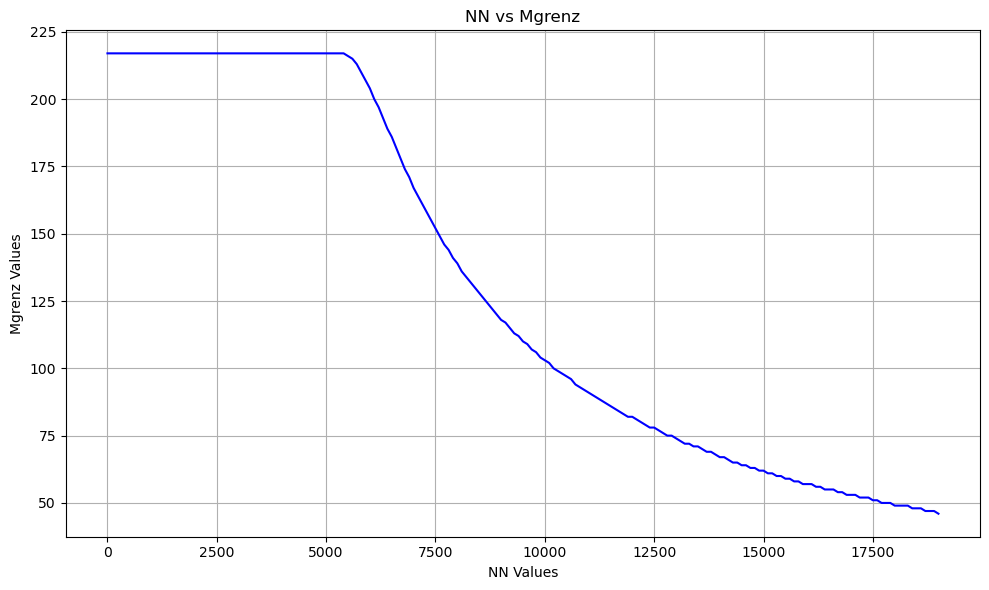

In [4]:
plot_kpi2d(nn_kpi2d, mgrenz_kpi2d)

Plot Exploration of a 3d KPI -ETA

In [4]:
nn_kpi3d = read_file_kpi3d(file_path, 'NN')
mm_kpi3d = read_file_kpi3d(file_path, 'MM')
eta_kpi3d = read_file_kpi3d(file_path, 'ETA')

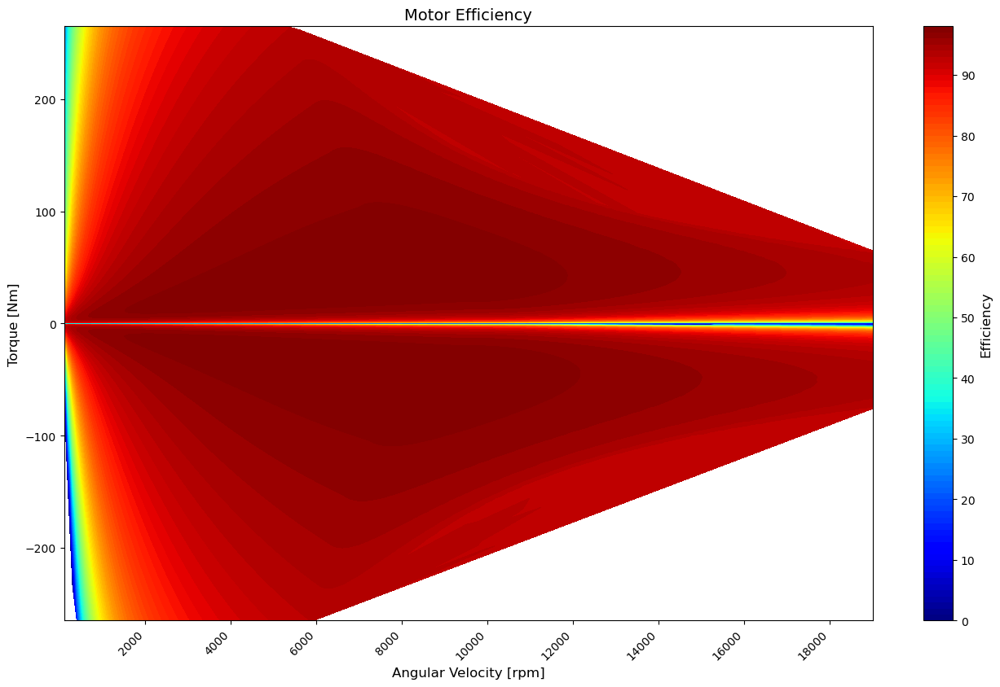

In [5]:
plot_kpi3d(nn_kpi3d, mm_kpi3d, eta_kpi3d)

Reading the tabular data

In [6]:
import pandas as pd

In [7]:
df_inputs=pd.read_csv('./data/TabularDataInputs.csv')

In [17]:
df_inputs.describe()

,lmsov2,lth1v2,lth2v2,r1v2,r11v2,r2v2,r3v2,r4v2,rmt1v2,rmt4v2,...,dhphp,dhpng,N,simQ,r_a,r_i,rad_phiv2,rad_phiv1,rad_phi3b1,rad_phi4b1
count,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,...,1481.000000,1481.000000,1481.0,1481.0,1.481000e+03,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000
mean,-0.000289,0.005395,0.002789,0.002097,0.000326,0.001873,0.000697,0.000747,0.000249,0.000249,...,0.000264,0.000406,4.0,6.0,9.000000e-02,0.064433,-0.511319,-0.694266,-0.002522,-0.000530
std,0.000035,0.000359,0.000178,0.000322,0.000040,0.000133,0.000044,0.000048,0.000016,0.000016,...,0.000014,0.000003,0.0,0.0,2.554375e-15,0.000902,0.063678,0.054700,0.056001,0.011775
min,-0.000300,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.645772,-0.785398,-1.256637,-0.261799
25%,-0.000300,0.005450,0.002800,0.002200,0.000300,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.558505,-0.733038,0.000000,0.000000
50%,-0.000300,0.005450,0.002800,0.002200,0.000300,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.523599,-0.698132,0.000000,0.000000
75%,-0.000300,0.005450,0.002800,0.002200,0.000350,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.471239,-0.645772,0.000000,0.000000
max,0.000000,0.005450,0.002800,0.002200,0.000600,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000485,0.000453,4.0,6.0,9.000000e-02,0.067000,0.000000,-0.453786,0.000000,0.000000


In [19]:
# Convert all float columns to float16
df_inputs = df_inputs.apply(lambda x: x.astype('float16') if np.issubdtype(x.dtype, np.floating) else x)

In [20]:
df_inputs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1481 entries, 0 to 1480
Data columns (total 90 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  1481 non-null   object 
 1   lmsov2      1481 non-null   float16
 2   lth1v2      1481 non-null   float16
 3   lth2v2      1481 non-null   float16
 4   r1v2        1481 non-null   float16
 5   r11v2       1481 non-null   float16
 6   r2v2        1481 non-null   float16
 7   r3v2        1481 non-null   float16
 8   r4v2        1481 non-null   float16
 9   rmt1v2      1481 non-null   float16
 10  rmt4v2      1481 non-null   float16
 11  rlt1v2      1481 non-null   float16
 12  rlt4v2      1481 non-null   float16
 13  hav2        1481 non-null   float16
 14  mbv2        1481 non-null   float16
 15  mhv2        1481 non-null   float16
 16  rmagv2      1481 non-null   float16
 17  dsmv2       1481 non-null   float16
 18  dsmuv2      1481 non-null   float16
 19  amtrv2      1481 non-null  

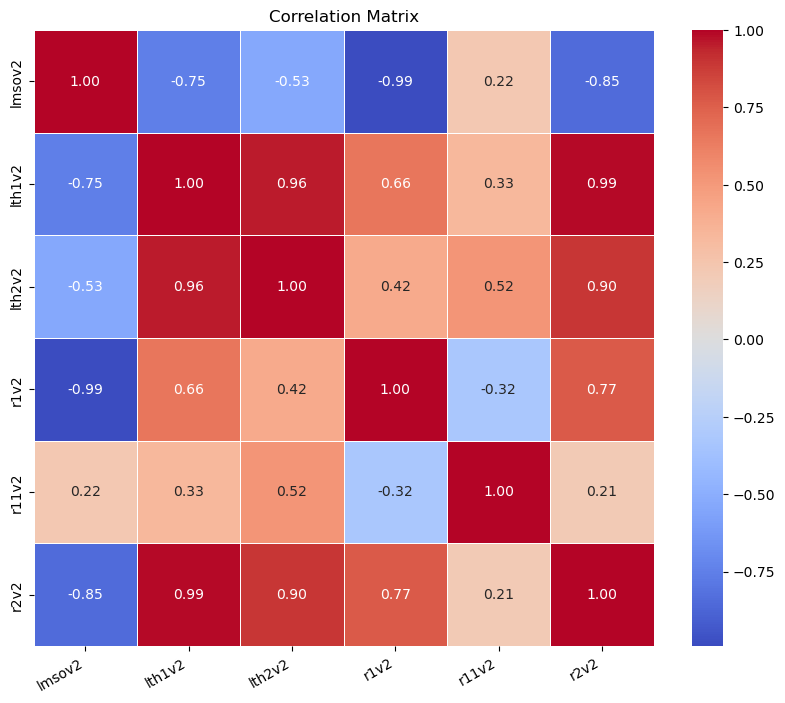

In [21]:
import seaborn as sns
# Assign the columns
columns_of_interest = ['lmsov2', 'lth1v2', 'lth2v2', 'r1v2', 'r11v2', 'r2v2']

# Calculate the correlation matrix
correlation_matrix = df_inputs[columns_of_interest].corr()

# Display the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.xticks(rotation=30, ha='right')
plt.show()

In [22]:
df_inputs

,Unnamed: 0,lmsov2,lth1v2,lth2v2,r1v2,r11v2,r2v2,r3v2,r4v2,rmt1v2,...,dhphp,dhpng,N,simQ,r_a,r_i,rad_phiv2,rad_phiv1,rad_phi3b1,rad_phi4b1
0,738562.5564_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0002,0.005100,0.0028,0.001200,0.00040,0.0017,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.067017,-0.453857,-0.645996,0.0,0.0
1,738561.6593_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00035,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.558594,-0.785156,0.0,0.0
2,738561.7042_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.523438,-0.715820,0.0,0.0
3,738561.7173_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.506348,-0.732910,0.0,0.0
4,738561.7112_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.593262,-0.628418,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1476,738561.6341_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00035,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.576172,-0.593262,0.0,0.0
1477,738561.6437_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00035,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.523438,-0.750488,0.0,0.0
1478,738562.5603_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0002,0.005100,0.0028,0.001200,0.00040,0.0017,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.067017,-0.453857,-0.698242,0.0,0.0
1479,738561.6945_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.558594,-0.750488,0.0,0.0


In [72]:
# import matplotlib.pyplot as plt
# import matplotlib.pyplot as plt

# for column in df_inputs.columns:
#     plt.figure(figsize=(10, 6))  # Create a figure for each histogram
#     plt.hist(df_inputs[column], bins=30, edgecolor='k')  # Adjust bins as necessary
#     plt.title(f'Histogram for {column}')
#     plt.xlabel(column)
#     plt.ylabel('Frequency')
#     plt.grid(True)
#     plt.show()

In [7]:
df_targets=pd.read_csv('./data/TabularDataTargets.csv')

In [8]:
df_targets

,Unnamed: 0,Column_1,Column_2,Column_3,Column_4,Column_5,Column_6,Column_7,Column_8,Column_9,...,Column_182,Column_183,Column_184,Column_185,Column_186,Column_187,Column_188,Column_189,Column_190,Column_191
0,738562.5564_PM180_HPIN_4layer_p4q2_doubleV_pit...,279,278,278,278,278,278,278,278,278,...,66,65,65,65,64,64,63,63,63,62
1,738561.6593_PM180_HPIN_4layer_p4q2_doubleV_pit...,259,259,259,259,259,259,259,259,259,...,70,69,69,69,68,68,67,67,66,66
2,738561.7042_PM180_HPIN_4layer_p4q2_doubleV_pit...,255,255,255,255,255,255,255,255,255,...,67,66,66,65,65,65,64,64,63,63
3,738561.7173_PM180_HPIN_4layer_p4q2_doubleV_pit...,249,249,249,249,249,249,248,248,248,...,64,63,62,62,62,61,61,60,60,60
4,738561.7112_PM180_HPIN_4layer_p4q2_doubleV_pit...,245,245,245,245,245,245,245,245,245,...,62,62,61,61,60,60,59,59,59,58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1476,738561.6341_PM180_HPIN_4layer_p4q2_doubleV_pit...,255,255,255,255,255,255,255,255,255,...,67,67,66,66,66,65,65,64,64,63
1477,738561.6437_PM180_HPIN_4layer_p4q2_doubleV_pit...,257,257,257,257,257,257,257,257,257,...,69,68,68,67,67,66,66,66,65,65
1478,738562.5603_PM180_HPIN_4layer_p4q2_doubleV_pit...,278,278,278,278,277,277,277,277,277,...,66,66,65,65,64,64,64,63,63,62
1479,738561.6945_PM180_HPIN_4layer_p4q2_doubleV_pit...,252,251,251,251,251,251,251,251,251,...,66,65,65,64,64,64,63,63,63,62


In [9]:
df_targets.describe()

,Column_1,Column_2,Column_3,Column_4,Column_5,Column_6,Column_7,Column_8,Column_9,Column_10,...,Column_182,Column_183,Column_184,Column_185,Column_186,Column_187,Column_188,Column_189,Column_190,Column_191
count,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,...,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000
mean,257.240378,256.906820,256.896016,256.886563,256.875084,256.860905,256.846725,256.835922,256.818366,256.806887,...,65.884537,65.409858,65.001350,64.553680,64.128967,63.717758,63.280891,62.902768,62.471303,62.088454
std,8.505897,8.473853,8.473727,8.472489,8.470772,8.469155,8.466716,8.465954,8.469187,8.467776,...,2.697253,2.671195,2.660014,2.633462,2.632485,2.598599,2.605756,2.575875,2.562335,2.551816
min,216.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,...,48.000000,48.000000,48.000000,47.000000,47.000000,47.000000,46.000000,46.000000,46.000000,46.000000
25%,252.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,...,64.000000,63.000000,63.000000,62.000000,62.000000,62.000000,61.000000,61.000000,60.000000,60.000000
50%,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,...,66.000000,66.000000,65.000000,65.000000,64.000000,64.000000,64.000000,63.000000,63.000000,62.000000
75%,261.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,...,68.000000,68.000000,67.000000,67.000000,66.000000,66.000000,66.000000,65.000000,65.000000,64.000000
max,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,...,70.000000,70.000000,69.000000,69.000000,68.000000,68.000000,67.000000,67.000000,66.000000,66.000000


Model training 

In [1]:
from src.data_preprocessing_tabular import data_prep_complete

In [2]:
import joblib

test_size=50
x_normalized, y1_normalized, y2_normalized, scaler_x, scaler_y1, scaler_y2, input_size, output_y1_size, output_y2_size, df_test_inputs, df_test_y1_targets, max_mgrenz = data_prep_complete(test_size)

# Store scalers and split test dataset locally to disk
joblib.dump(scaler_x, './Intermediate/scaler_x.pkl')
joblib.dump(scaler_y1, './Intermediate/scaler_y1.pkl')
joblib.dump(scaler_y2, './Intermediate/scaler_y2.pkl')
joblib.dump(max_mgrenz, './Intermediate/max_mgrenz.pkl')
df_test_inputs.to_pickle('./Intermediate/df_test_inputs.pkl')
df_test_y1_targets.to_pickle('./Intermediate/df_test_y1_targets.pkl')

280


/home/k64889/miniconda3/envs/thesis/lib/python3.10/site-packages/sklearn/utils/_array_api.py:701: RuntimeWarning: All-NaN slice encountered
  return xp.asarray(numpy.nanmin(X, axis=axis))
/home/k64889/miniconda3/envs/thesis/lib/python3.10/site-packages/sklearn/utils/_array_api.py:718: RuntimeWarning: All-NaN slice encountered
  return xp.asarray(numpy.nanmax(X, axis=axis))


1.0000000000000284
-1.0


In [3]:
print(x_normalized.shape)
print(y1_normalized.shape)
print(y2_normalized.shape)

(1431, 89)
(1431, 191)
(1431, 561, 191)


In [ ]:
Training 

In [4]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset
from src.model import mlp_kpi3d
from src.training import mlp_kpi3d_trainer as mlp_kpi3d_trainer, LossRegularisation as loss_regularisation
from sklearn.model_selection import KFold
import wandb
import numpy as np
import torch.optim.lr_scheduler as lr_scheduler
import os

#hyperparameters
p=0.2   # dropout rate
hidden_sizes = 256  #256 max..else OOM
batch_size = 72     ##try with 72 also
epochs = 10
learning_rate = 0.00075
lambda_loss_regularizer=1.5
splits=5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

kf = KFold(n_splits=splits, shuffle=True, random_state=42)##Goto store splits and load from there to be sure of reproducibiiity
# Store the cross-validation splits
splits_file = './Intermediate/cross_val_splits.npy'
# splits_indices=kf.split(x_normalized)
# splits_indices = [(train_index, val_index) for train_index, val_index in kf.split(x_normalized)]
# np.save(splits_file, np.array(splits_indices, dtype=object), allow_pickle=True)

# Load the cross-validation splits
splits_indices = np.load(splits_file, allow_pickle=True)

# Lists to store results
cross_train_losses_y1, cross_train_losses_y2 = [], []
cross_val_losses_y1, cross_val_losses_y2 = [], []
cross_train_score_y1, cross_train_score_y2 = [], []
cross_val_score_y1, cross_val_score_y2  = [], []

best_combined_loss = 300
best_y1_score = 10
best_y2_score = 10
best_model = None
best_fold = -1

for fold, (train_index, val_index) in enumerate(splits_indices, 1):
    
    # Initialize wandb with a group to aggregate all runs of each cross-validation fold
    wandb.init(project="EM", config={
        "learning_rate": learning_rate,
        "architecture": "MLP",
        "hidden sizes": hidden_sizes,
        "epochs": epochs,
        "lambda loss regularizer": lambda_loss_regularizer,
        "Learning Rate Scheduler": "exponential",
        "Dropout Rate": p
        }, group="26th reduced hidden layer count by 1 whole layer hidden layers decreased for y2", name=f"Fold {fold}")
    
    
    # Train-Validation data as per cross val splits
    x_train, x_val = x_normalized[train_index], x_normalized[val_index]
    y1_train, y1_val = y1_normalized[train_index], y1_normalized[val_index]
    y2_train, y2_val = y2_normalized[train_index], y2_normalized[val_index]
    
    train_dataset = TensorDataset(torch.FloatTensor(x_train).to(device), torch.FloatTensor(y1_train).to(device), torch.FloatTensor(y2_train).to(device))
    val_dataset = TensorDataset(torch.FloatTensor(x_val).to(device), torch.FloatTensor(y1_val).to(device), torch.FloatTensor(y2_val).to(device))
    
    y2_shape = (batch_size, y2_train.shape[1], y2_train.shape[2])  
    
    # TODO Then whats the benefit of doing k times?
    model = mlp_kpi3d(input_size, hidden_sizes, output_y1_size, y2_shape,p)
    #loss = nn.MSELoss()
    
    loss = loss_regularisation(lambda_loss_regularizer)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    #lrscheduler = lr_scheduler.LinearLR(optimizer, total_iters=10)
    lrscheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.9)
    
    trainer = mlp_kpi3d_trainer(model, train_dataset, val_dataset, batch_size, loss, optimizer, lrscheduler, device)
    
    trainer.train(epochs)

    cross_train_losses_y1.append(trainer.train_loss_history_y1)
    cross_train_losses_y2.append(trainer.train_loss_history_y2)
    cross_val_losses_y1.append(trainer.val_loss_history_y1)
    cross_val_losses_y2.append(trainer.val_loss_history_y2)
    cross_train_score_y1.append(trainer.train_score_history_y1)
    cross_train_score_y2.append(trainer.train_score_history_y2)
    cross_val_score_y1.append(trainer.val_score_history_y1)
    cross_val_score_y2.append(trainer.val_score_history_y2)
    
    # Combined loss of y1 and y2 per fold
    combined_loss = trainer.val_loss_history_y1[-1] + trainer.val_loss_history_y2[-1]
    
    # Combined loss of y1 and y2 to be the least and r2 score to be as close to 1 as possible
    if combined_loss < best_combined_loss and trainer.val_score_history_y1[-1] < best_y1_score and trainer.val_score_history_y2[-1] < best_y1_score:
        best_combined_loss = combined_loss
        best_y1_score = trainer.val_score_history_y1[-1]
        best_y2_score = trainer.val_score_history_y2[-1]
        print(f"Fold : {fold} Best combined loss: {best_combined_loss} Best y1 score: {best_y1_score} Best y2 score: {best_y2_score}")
        best_model = model
        best_fold = fold
        
if best_model is not None:
    model.save('./Intermediate/model.pth')
    print(f"Best model saved from fold {best_fold}")
else:
    print("No model met the criteria for saving")
        
# Save the best model as an artifact to wandb...can also save cross val splits if necessary, altho think not...
# model_artifact = wandb.Artifact(f"best_model_fold_{fold}", type="model")
# model_artifact.add_file('./Intermediate/model.pth')
# model_artifact.metadata['best_y1_score'] = best_y1_score
# model_artifact.metadata['best_y2_score'] = best_y2_score
# model_artifact.metadata['best_combined_loss'] = best_combined_loss
# model_artifact.metadata['model skeleton'] = best_model

# wandb.log_artifact(model_artifact)

wandb.finish()

# Calculate average metrics across folds
avg_train_losses_y1 = torch.mean(torch.tensor(cross_train_losses_y1), dim=0)
avg_train_losses_y2 = torch.mean(torch.tensor(cross_train_losses_y2), dim=0)
avg_val_losses_y1 = torch.mean(torch.tensor(cross_val_losses_y1), dim=0)
avg_val_losses_y2 = torch.mean(torch.tensor(cross_val_losses_y2), dim=0)

avg_train_r2_y1 = torch.mean(torch.tensor(cross_train_score_y1), dim=0)
avg_train_r2_y2 = torch.mean(torch.tensor(cross_train_score_y2), dim=0)
avg_val_r2_y1 = torch.mean(torch.tensor(cross_val_score_y1), dim=0)
avg_val_r2_y2 = torch.mean(torch.tensor(cross_val_score_y2), dim=0)


# Print the best fold's performance
print(f"Best fold: {best_fold}")
print(f"Best combined validation loss: {best_combined_loss}")
print(f"Best validation Score for y1: {best_y1_score}")
print(f"Best validation Score for y2: {best_y2_score}")

#Disk quota dangerously exceeding, so delete the artifact locally immediately after training
wandb_folder = os.path.expanduser('~/.local/share/wandb')
if os.path.exists(wandb_folder):
    for root, dirs, files in os.walk(wandb_folder, topdown=False):
        for name in files:
            os.remove(os.path.join(root, name))
        for name in dirs:
            os.rmdir(os.path.join(root, name))
    os.rmdir(wandb_folder)
    print(f"Deleted the folder: {wandb_folder}")
else:
    print(f"The folder {wandb_folder} does not exist.")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: lilly-abraham (lilly-abraham-technische-hochschule-w-rzburg-schweinfurt). Use `wandb login --relogin` to force relogin


Fold : 1 Best combined loss: 0.0066262196840627206 Best y1 score: 0.09897691011428833 Best y2 score: 0.73919677734375


train_loss,█▃▂▂▁▁▁▁▁▁
train_loss_y1,█▄▂▂▁▁▁▁▁▁
train_loss_y2,█▂▂▁▁▁▁▁▁▁
train_score,█▄▂▂▁▁▁▁▁▁
train_score_y1,█▅▃▂▁▁▁▁▁▁
train_score_y2,█▃▂▂▂▂▂▁▂▁
val_loss,█▄▂▂▁▁▁▁▁▁
val_loss_y1,█▄▂▂▁▁▁▁▁▁
val_loss_y2,█▃▂▁▂▁▂▁▁▁
val_score,█▅▃▂▂▂▂▁▁▁
val_score_y1,█▅▃▂▂▂▂▁▁▁


train_loss,█▃▂▂▁▁▁▁▁▁
train_loss_y1,█▃▂▂▁▁▁▁▁▁
train_loss_y2,█▂▂▂▁▁▁▁▁▁
train_score,█▄▃▂▂▁▁▁▁▁
train_score_y1,█▄▂▂▂▁▁▁▁▁
train_score_y2,█▃▃▃▃▂▂▂▁▁
val_loss,█▄▂▂▂▁▁▁▁▁
val_loss_y1,█▄▂▂▁▁▁▁▁▁
val_loss_y2,█▄▃▂▃▂▁▁▁▁
val_score,█▅▃▂▂▂▁▁▁▁
val_score_y1,█▅▃▂▂▂▁▁▁▁


train_loss,█▃▂▂▁▁▁▁▁▁
train_loss_y1,█▃▂▂▁▁▁▁▁▁
train_loss_y2,█▂▂▁▁▁▁▁▁▁
train_score,█▄▃▂▂▁▁▁▁▁
train_score_y1,█▄▂▂▂▁▁▁▁▁
train_score_y2,█▃▃▂▂▁▂▁▂▂
val_loss,█▄▃▂▁▁▁▁▁▁
val_loss_y1,█▄▃▂▂▁▁▁▁▁
val_loss_y2,█▂▂▁▁▁▁▁▁▁
val_score,█▅▃▂▂▂▁▁▁▁
val_score_y1,█▅▃▂▂▂▁▁▁▁


train_loss,█▃▂▂▁▁▁▁▁▁
train_loss_y1,█▃▂▂▁▁▁▁▁▁
train_loss_y2,█▂▂▁▁▁▁▁▁▁
train_score,█▄▂▂▂▂▁▁▁▁
train_score_y1,█▄▂▂▂▁▁▁▁▁
train_score_y2,█▃▂▂▂▂▂▂▁▁
val_loss,█▄▂▂▁▁▁▁▁▁
val_loss_y1,█▄▂▂▁▁▁▁▁▁
val_loss_y2,█▄▃▂▂▂▂▁▁▁
val_score,█▅▃▂▂▁▁▁▁▁
val_score_y1,█▅▃▂▂▁▁▁▁▁


Best model saved from fold 1


train_loss,█▃▂▂▁▁▁▁▁▁
train_loss_y1,█▄▂▂▁▁▁▁▁▁
train_loss_y2,█▂▂▁▁▁▁▁▁▁
train_score,█▄▃▂▂▁▁▁▁▁
train_score_y1,█▄▃▂▂▁▁▁▁▁
train_score_y2,█▃▃▂▂▂▂▁▁▁
val_loss,█▅▃▂▂▁▁▁▁▁
val_loss_y1,█▅▄▂▂▁▁▁▁▁
val_loss_y2,█▃▂▁▁▁▁▁▁▁
val_score,█▆▄▃▂▂▂▁▁▁
val_score_y1,█▆▄▃▂▂▁▁▁▁


Best fold: 1
Best combined validation loss: 0.0066262196840627206
Best validation Score for y1: 0.09897691011428833
Best validation Score for y2: 0.73919677734375
The folder /home/k64889/.local/share/wandb does not exist.


In [6]:
model

mlp_kpi3d(
  (shared_layers): Sequential(
    (0): Linear(in_features=89, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.2, inplace=False)
  )
  (y1_layers): Sequential(
    (0): Linear(in_features=256, out_features=191, bias=True)
  )
  (y2_layers): Sequential(
    (0): Linear(in_features=256, out_features=2048, bias=True)
    (1): BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.2, inplace=False)
    (4): Linear(in_features=2048, out_features=4096, bias=True)
    (5): BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.2, inplace=False)
    (8): Linear(in_features=4096, out_features=107151, bias=True)
  )
)

In [20]:
Inference

NameError: name 'a' is not defined

In [7]:
import joblib

scaler_x = joblib.load('./Intermediate/scaler_x.pkl')
scaler_y1 = joblib.load('./Intermediate/scaler_y1.pkl')
scaler_y2 = joblib.load('./Intermediate/scaler_y2.pkl')
max_mgrenz = joblib.load('./Intermediate/max_mgrenz.pkl')

In [ ]:
New files

In [55]:
from src.table_creation import create_tabular_data
import pandas as pd
import os

from tqdm import tqdm

directory = '/home/k64889/Masters-Thesis/data/AllTopologies'

df_test_inputs=pd.DataFrame()
df_test_y1_targets=pd.DataFrame()

for filename in tqdm(os.listdir(directory)):
    file_path = os.path.join(directory, filename)
    df_partial_inputs, df_partial_targets = create_tabular_data(file_path, purpose='test')
    
    if df_partial_inputs is not None:
        df_test_inputs = pd.concat([df_test_inputs, df_partial_inputs])
        
    if df_partial_targets is not None:
        df_test_y1_targets = pd.concat([df_test_y1_targets, df_partial_targets])
        

100%|██████████| 9/9 [02:30<00:00, 16.74s/it]


In [ ]:
Test Dataset

In [8]:
import pandas as pd
df_test_inputs = pd.read_pickle('./Intermediate/df_test_inputs.pkl')
df_test_y1_targets = pd.read_pickle('./Intermediate/df_test_y1_targets.pkl')

In [9]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [ ]:
With MM

In [12]:
from src.inference import generate_predictions_mm
model_path='./Intermediate/model.pth'
df_predictions_y1, predictions_original_scale_y2, mm, eta_matrix = generate_predictions_mm(model_path, df_test_inputs, df_test_y1_targets, scaler_x, scaler_y1, scaler_y2, device)

Predictions shape: (50, 191)
Predictions shape: (50, 561, 191)


ValueError: could not broadcast input array from shape (569,191) into shape (4,191)

In [13]:
df_test_y1_targets.index

Index(['738562.5614_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_020_000013',
       '738561.6696_PM180_HPIN_4layer_p4q2_doubleV_pitched_047_000002',
       '738561.65_PM180_HPIN_4layer_p4q2_doubleV_pitched_029_000004',
       '738561.6576_PM180_HPIN_4layer_p4q2_doubleV_pitched_036_000003',
       '738561.6413_PM180_HPIN_4layer_p4q2_doubleV_pitched_009_000005',
       '738561.7001_PM180_HPIN_4layer_p4q2_doubleV_pitched_074_000010',
       '738611.6026_PM180_HPIN_4layer_p4q2_doubleV_pitched_127_000001',
       '738562.5546_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_015_000010',
       '738561.6756_PM180_HPIN_4layer_p4q2_doubleV_pitched_052_000007',
       '738561.6858_PM180_HPIN_4layer_p4q2_doubleV_pitched_061_000010',
       '738561.6351_PM180_HPIN_4layer_p4q2_doubleV_pitched_003_000009',
       '738562.5587_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_018_000012',
       '738611.6013_PM180_HPIN_4layer_p4q2_doubleV_pitched_124_000006',
       '738611.6152_PM180_HPIN_4layer_p4q2_doubleV_pit

Sample 0:
Original ETA shape: (544, 191)
Predicted ETA shape: (555, 191)
Original MM shape: (544,)
Predicted MM shape: (555,)


<Figure size 2400x2000 with 0 Axes>

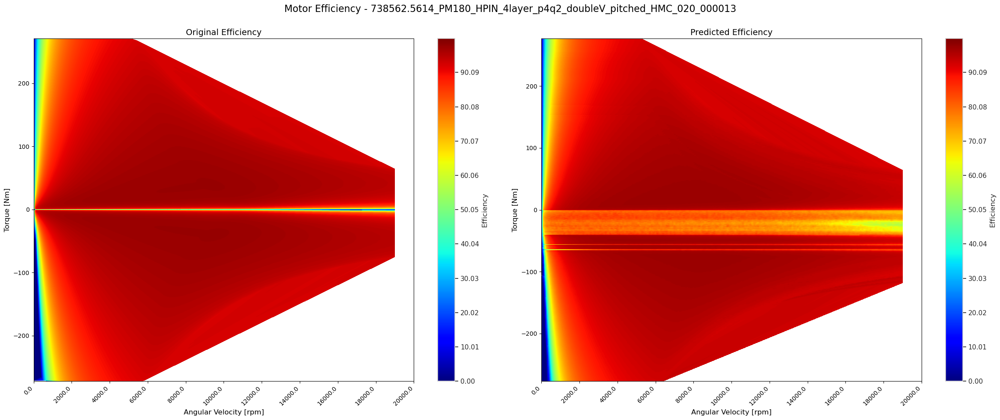

Sample 1:
Original ETA shape: (516, 191)
Predicted ETA shape: (525, 191)
Original MM shape: (516,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

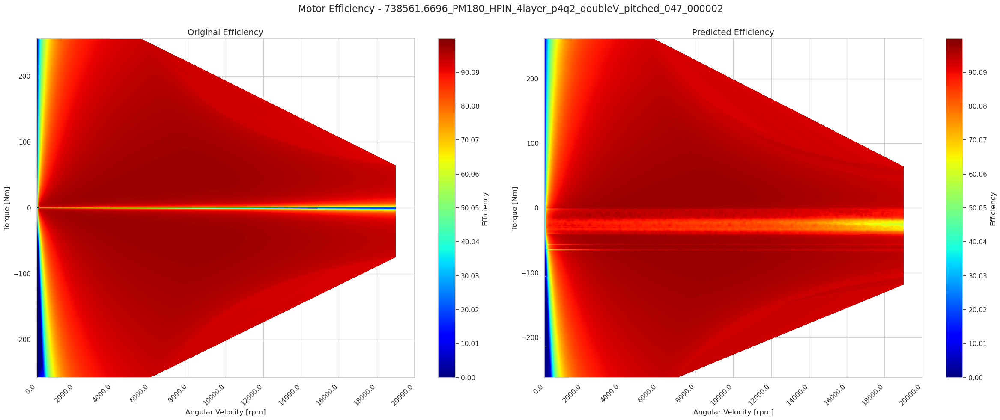

Sample 2:
Original ETA shape: (532, 191)
Predicted ETA shape: (525, 191)
Original MM shape: (532,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

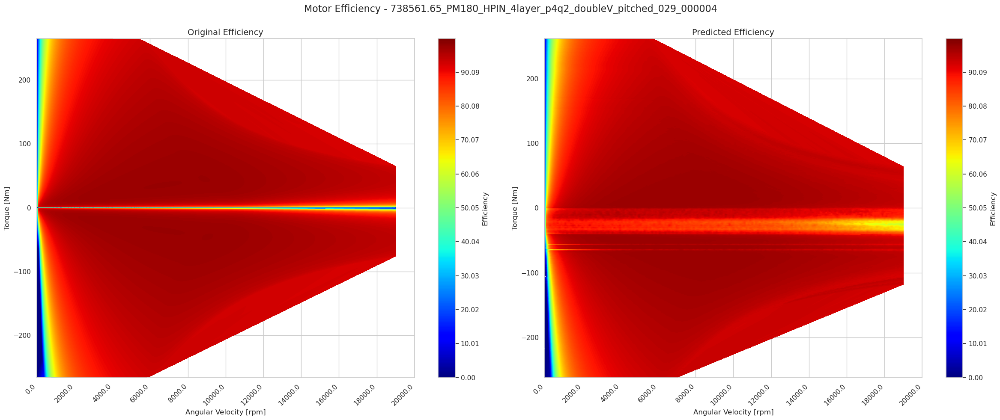

In [22]:
from src.utils import read_file_kpi3d, read_mm_nn
from src.inference import plot_kpi3d_dual_mm
import numpy as np
import matplotlib.pyplot as plt

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

max_index = 3

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    print(f"Sample {index_no}:")
    print(f"Original ETA shape: {eta_kpi3d.shape}")
    print(f"Predicted ETA shape: {eta_predicted.shape}")
    print(f"Original MM shape: {mm_kpi3d.shape}")
    print(f"Predicted MM shape: {mm_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    plot_kpi3d_dual_mm(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

<Figure size 2400x2000 with 0 Axes>

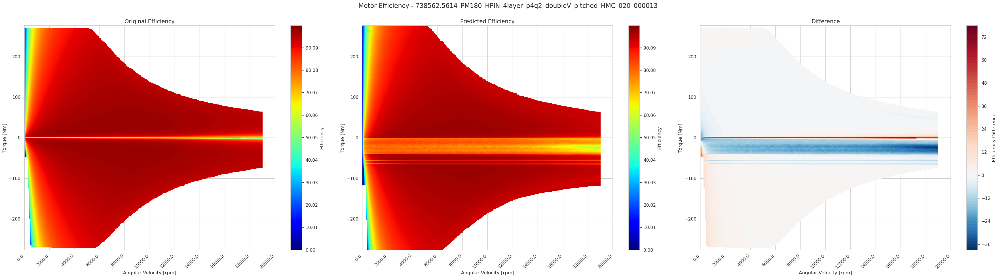

<Figure size 2400x2000 with 0 Axes>

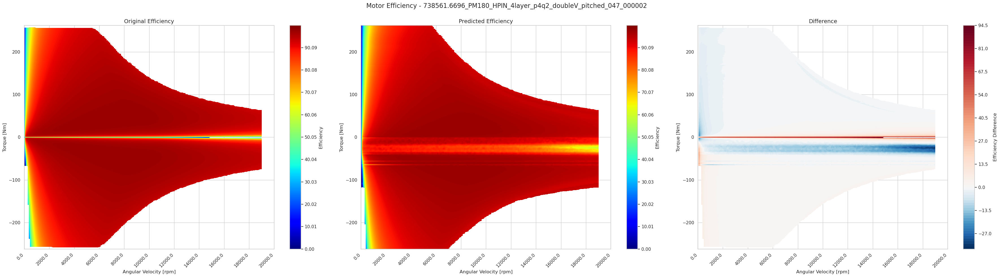

<Figure size 2400x2000 with 0 Axes>

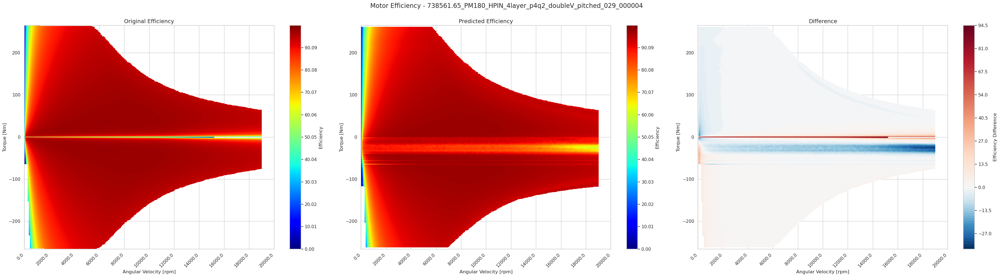

<Figure size 2400x2000 with 0 Axes>

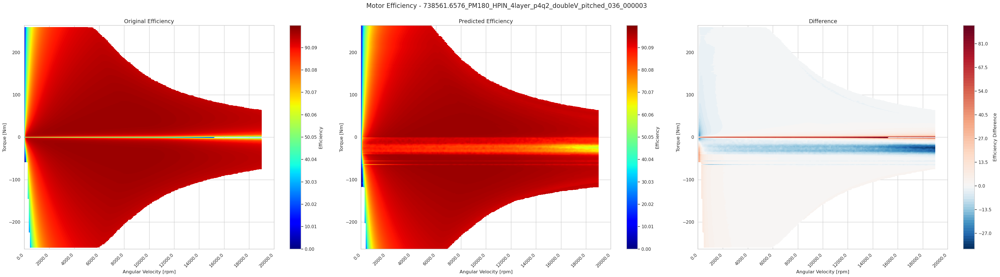

<Figure size 2400x2000 with 0 Axes>

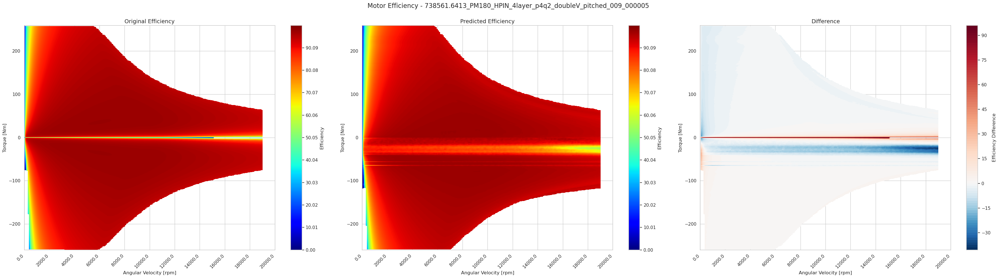

In [23]:
from src.utils import read_file_kpi3d, read_mm_nn
from src.inference import eval_plot_kpi3d_mm
import numpy as np
import matplotlib.pyplot as plt

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

max_index = 5

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    #mm_kpi3d = read_file_kpi3d(file_path, 'MM')
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = np.array(eta_matrix[index_no])
    mm_predicted = mm[index_no]
    
    # print(f"Sample {index_no}:")
    # print(f"Original ETA shape: {eta_kpi3d.shape}")
    # print(f"Predicted ETA shape: {eta_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    eval_plot_kpi3d_mm(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

In [30]:
from src.utils import read_file_kpi3d, read_mm_nn
from src.inference import y2_score_mm
import numpy as np
import matplotlib.pyplot as plt

nn_kpi_2d = list(range(0, 19100, 100))
#nn_kpi_2d = read_mm_nn(file_path, 'NN')
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

score=0
max_index = 2

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    # print(f"Sample {index_no}:")
    # print(f"Original ETA shape: {eta_kpi3d.shape}")
    # print(f"Predicted ETA shape: {eta_predicted.shape}")

    # Calculate the Y2 score
    score += y2_score_mm(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted)
    
y2_score = score/max_index
print(f"Average Y2 Score: {y2_score:.4f}")

Average Y2 Score: 8.0339


In [ ]:
Inference without considering MM for ETA grid

In [10]:
from src.inference import generate_predictions
model_path='./Intermediate/model.pth'
df_predictions_y1, predictions_original_scale_y2, mm, eta_matrix = generate_predictions(model_path, df_test_inputs, df_test_y1_targets, scaler_x, scaler_y1, scaler_y2, device)

Predictions shape: (50, 191)
Predictions shape: (50, 561, 191)


Sample 0:
Original ETA shape: (544, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (544,)
Predicted MM shape: (555,)


<Figure size 2400x2000 with 0 Axes>

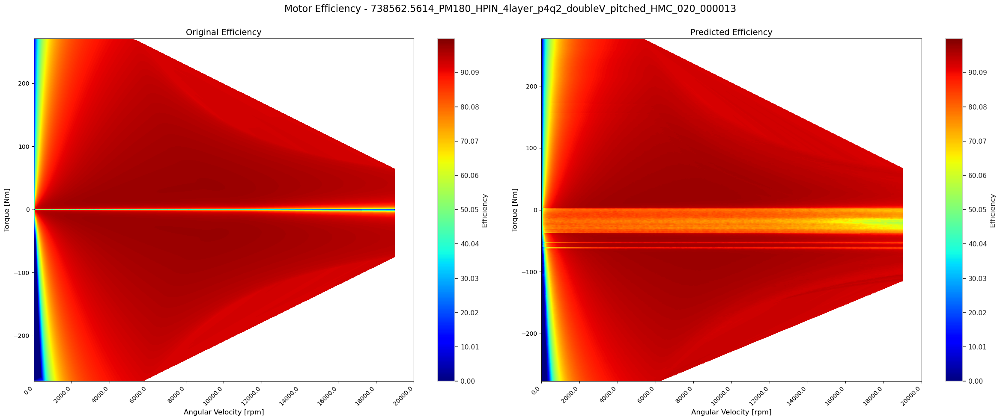

Sample 1:
Original ETA shape: (516, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (516,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

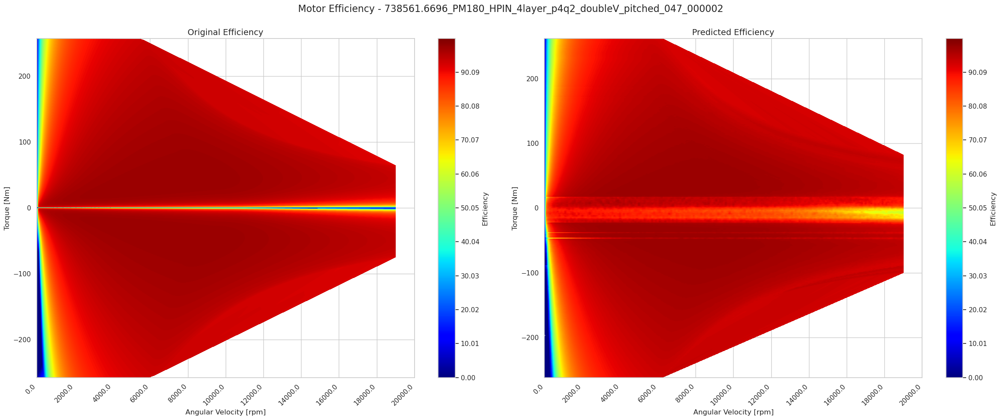

Sample 2:
Original ETA shape: (532, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (532,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

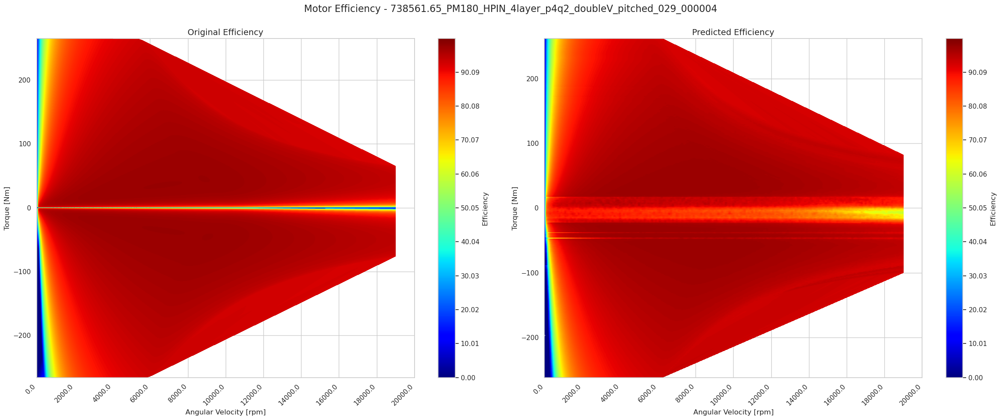

Sample 3:
Original ETA shape: (524, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (524,)
Predicted MM shape: (529,)


<Figure size 2400x2000 with 0 Axes>

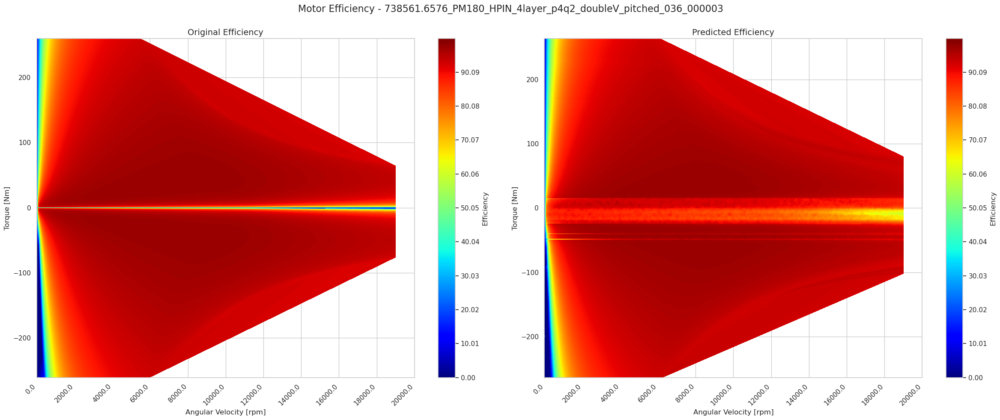

Sample 4:
Original ETA shape: (520, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (520,)
Predicted MM shape: (519,)


<Figure size 2400x2000 with 0 Axes>

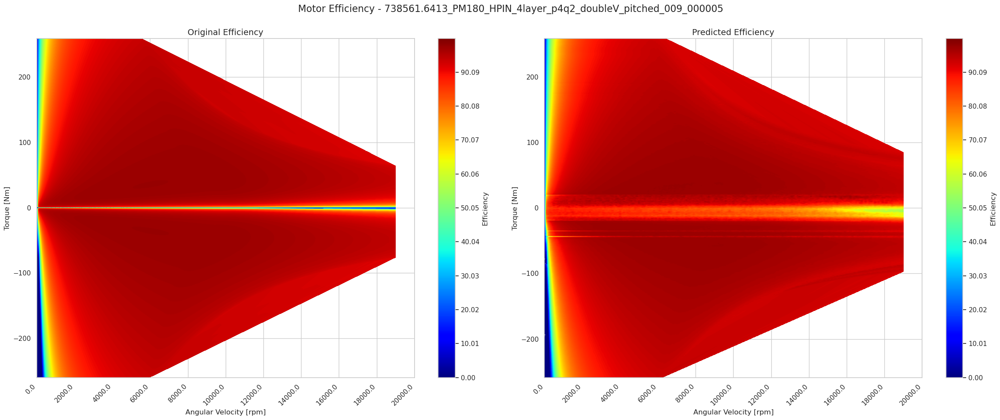

Sample 5:
Original ETA shape: (508, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (508,)
Predicted MM shape: (513,)


<Figure size 2400x2000 with 0 Axes>

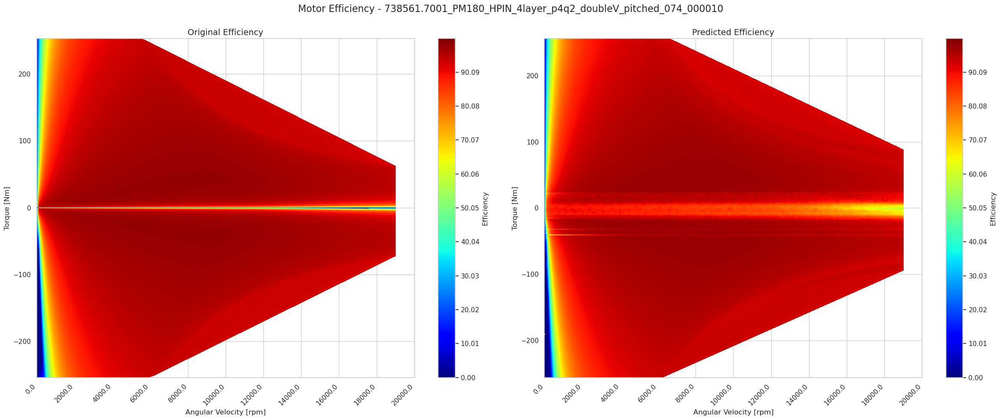

Sample 6:
Original ETA shape: (536, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (536,)
Predicted MM shape: (531,)


<Figure size 2400x2000 with 0 Axes>

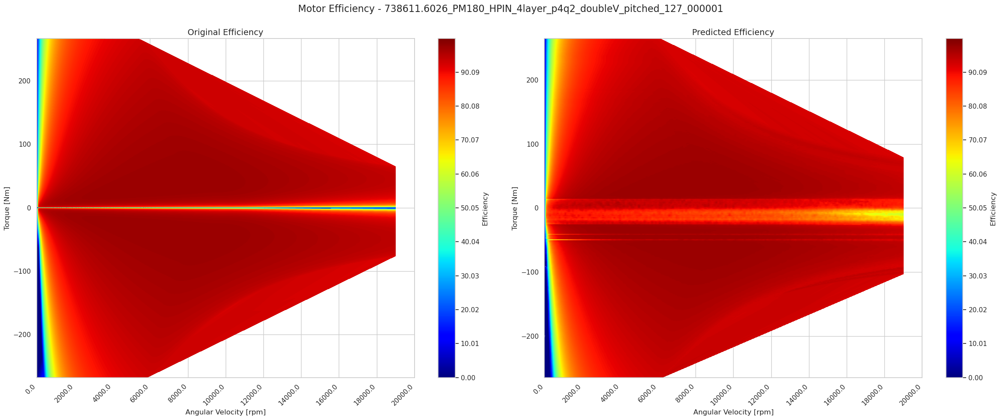

Sample 7:
Original ETA shape: (556, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (556,)
Predicted MM shape: (553,)


<Figure size 2400x2000 with 0 Axes>

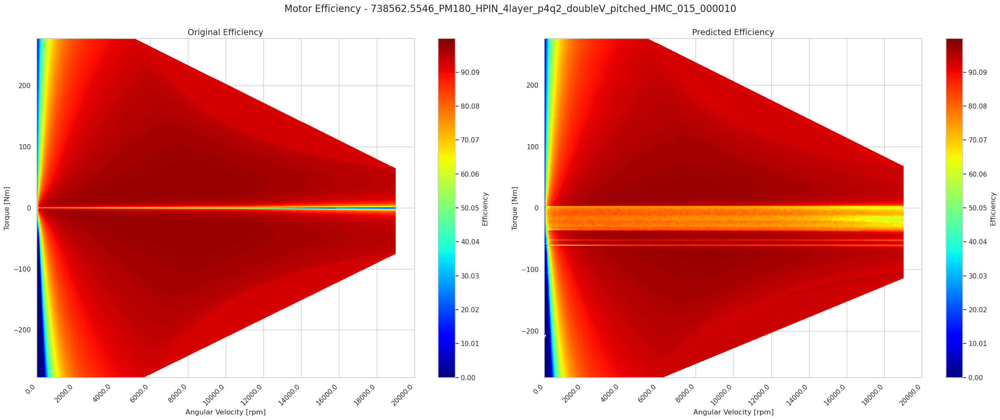

Sample 8:
Original ETA shape: (500, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (500,)
Predicted MM shape: (501,)


<Figure size 2400x2000 with 0 Axes>

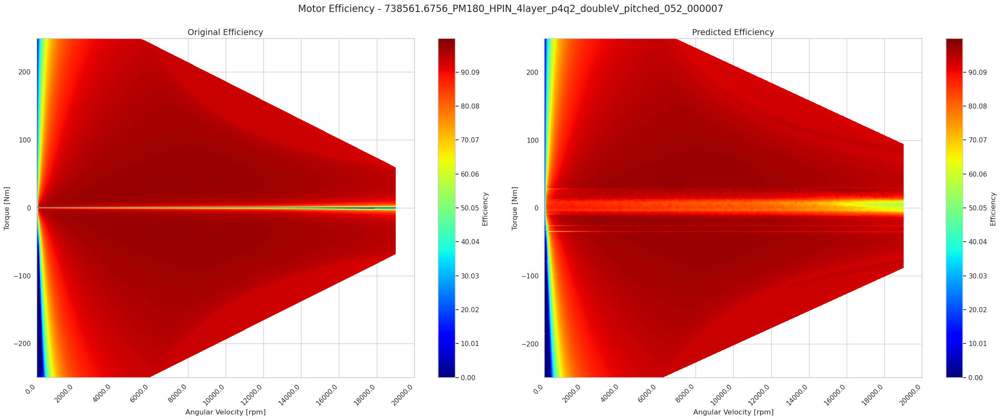

In [10]:
from src.utils import read_file_kpi3d, read_mm_nn
from src.inference import plot_kpi3d_dual
import numpy as np
import matplotlib.pyplot as plt

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

max_index = 9

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    print(f"Sample {index_no}:")
    print(f"Original ETA shape: {eta_kpi3d.shape}")
    print(f"Predicted ETA shape: {eta_predicted.shape}")
    print(f"Original MM shape: {mm_kpi3d.shape}")
    print(f"Predicted MM shape: {mm_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    plot_kpi3d_dual(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

Sample 0:
Original ETA shape: (544, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (544,)
Predicted MM shape: (555,)


<Figure size 2400x2000 with 0 Axes>

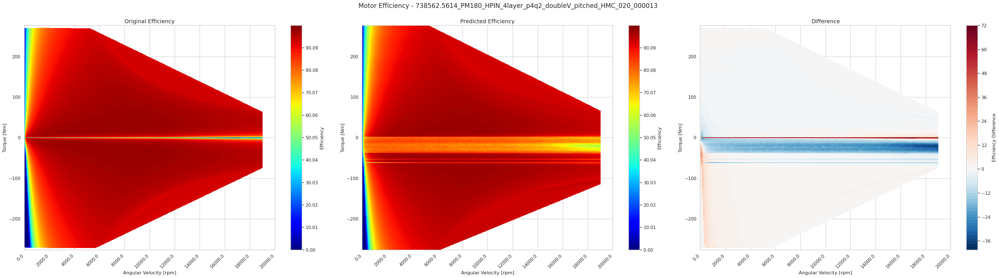

Sample 1:
Original ETA shape: (516, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (516,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

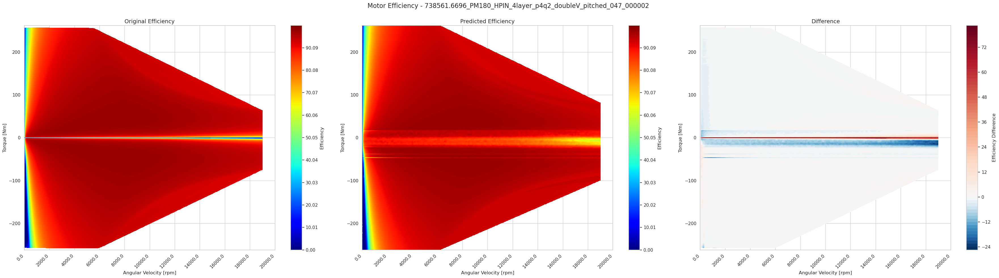

Sample 2:
Original ETA shape: (532, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (532,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

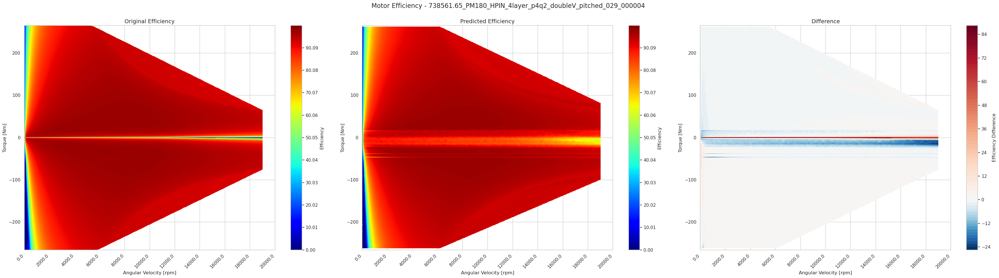

Sample 3:
Original ETA shape: (524, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (524,)
Predicted MM shape: (529,)


<Figure size 2400x2000 with 0 Axes>

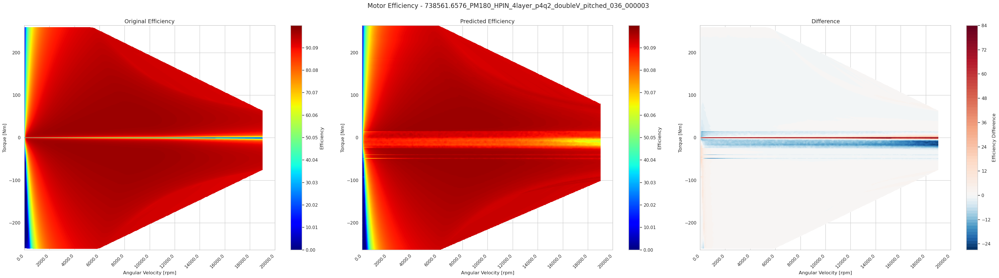

Sample 4:
Original ETA shape: (520, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (520,)
Predicted MM shape: (519,)


<Figure size 2400x2000 with 0 Axes>

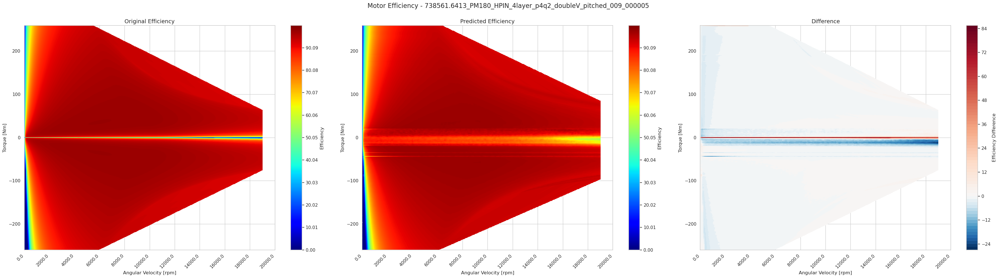

Sample 5:
Original ETA shape: (508, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (508,)
Predicted MM shape: (513,)


<Figure size 2400x2000 with 0 Axes>

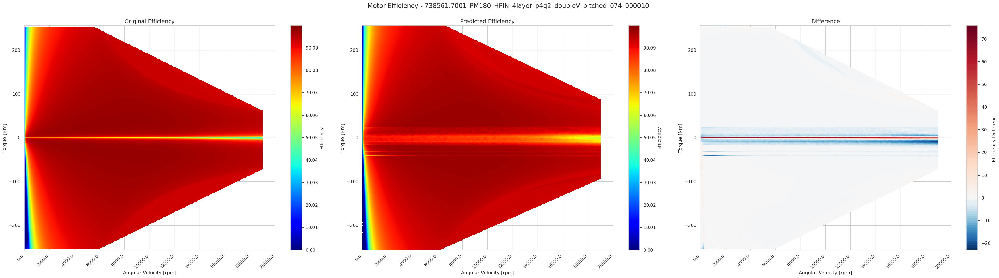

Sample 6:
Original ETA shape: (536, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (536,)
Predicted MM shape: (531,)


<Figure size 2400x2000 with 0 Axes>

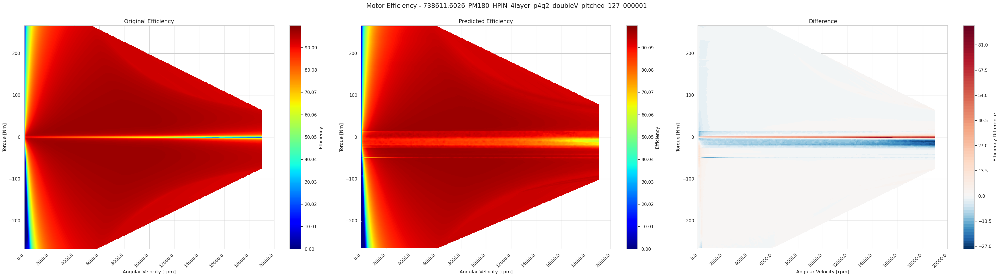

Sample 7:
Original ETA shape: (556, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (556,)
Predicted MM shape: (553,)


<Figure size 2400x2000 with 0 Axes>

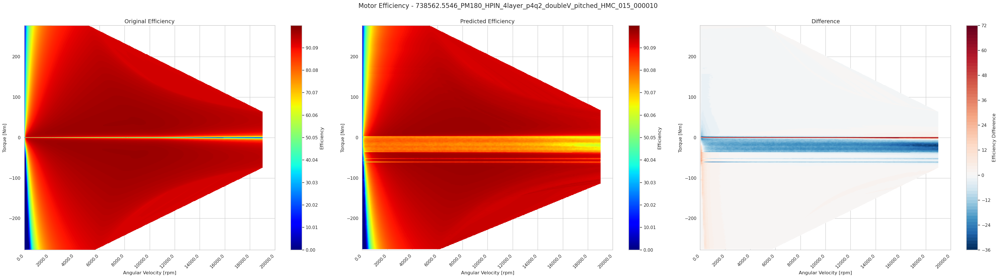

Sample 8:
Original ETA shape: (500, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (500,)
Predicted MM shape: (501,)


<Figure size 2400x2000 with 0 Axes>

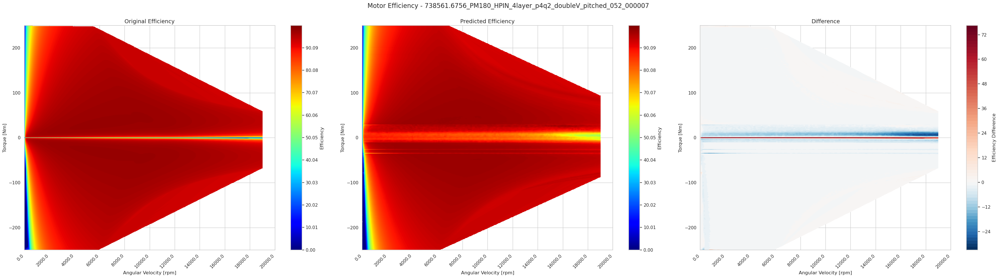

Sample 9:
Original ETA shape: (506, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (506,)
Predicted MM shape: (515,)


<Figure size 2400x2000 with 0 Axes>

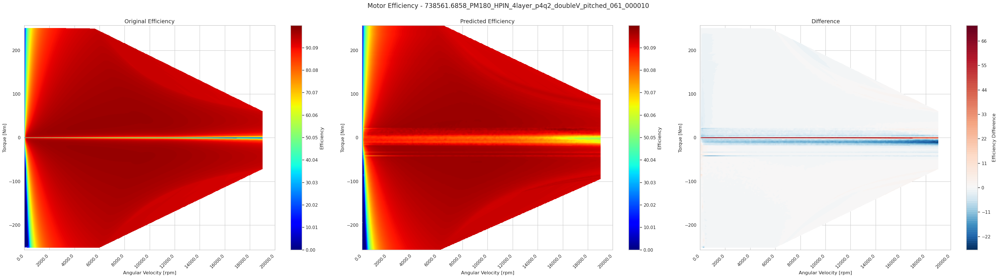

Sample 10:
Original ETA shape: (518, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (518,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

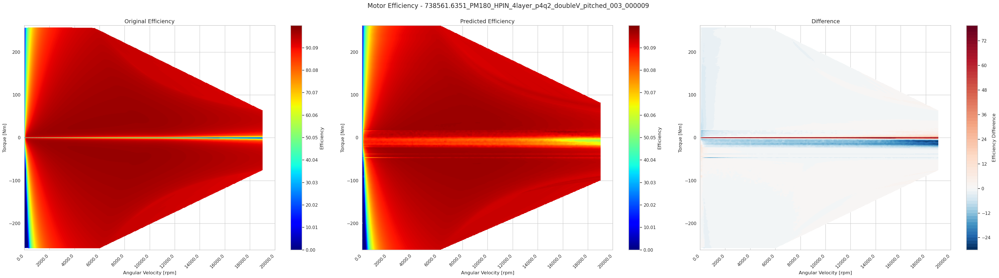

Sample 11:
Original ETA shape: (550, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (550,)
Predicted MM shape: (553,)


<Figure size 2400x2000 with 0 Axes>

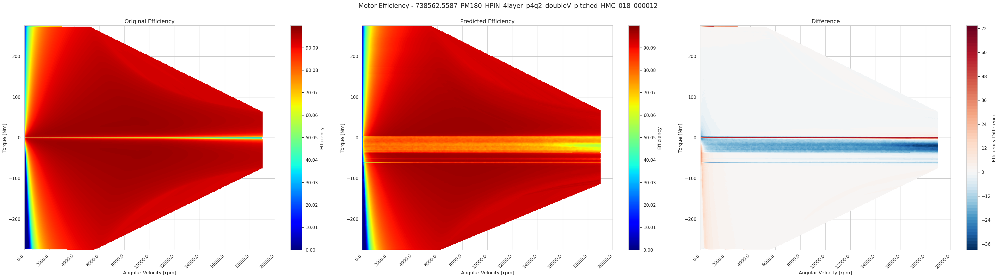

Sample 12:
Original ETA shape: (532, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (532,)
Predicted MM shape: (529,)


<Figure size 2400x2000 with 0 Axes>

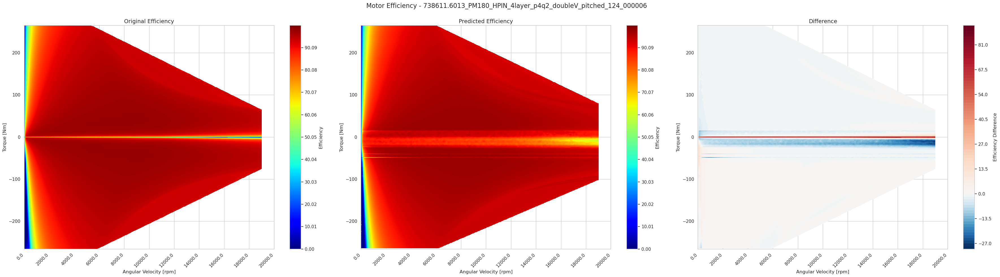

Sample 13:
Original ETA shape: (528, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (528,)
Predicted MM shape: (517,)


<Figure size 2400x2000 with 0 Axes>

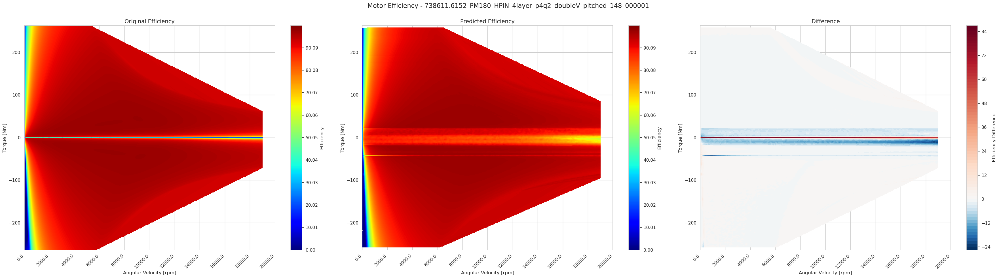

Sample 14:
Original ETA shape: (530, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (530,)
Predicted MM shape: (527,)


<Figure size 2400x2000 with 0 Axes>

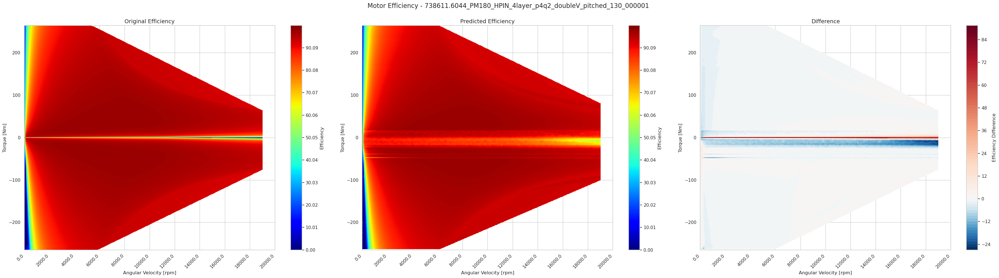

Sample 15:
Original ETA shape: (502, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (502,)
Predicted MM shape: (509,)


<Figure size 2400x2000 with 0 Axes>

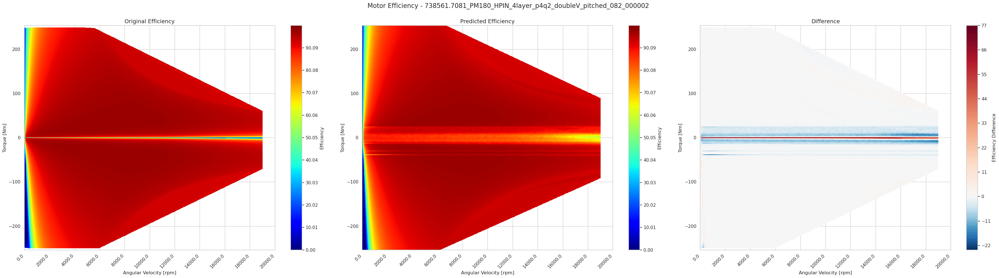

Sample 16:
Original ETA shape: (522, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (522,)
Predicted MM shape: (519,)


<Figure size 2400x2000 with 0 Axes>

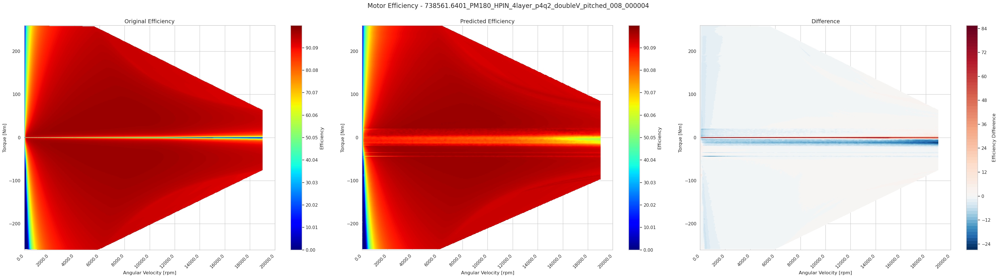

Sample 17:
Original ETA shape: (552, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (552,)
Predicted MM shape: (547,)


<Figure size 2400x2000 with 0 Axes>

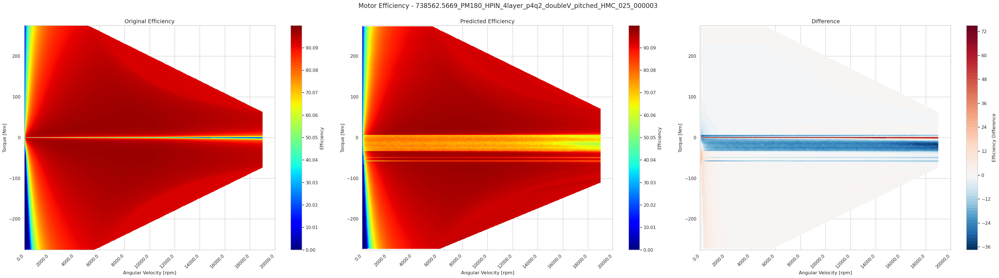

Sample 18:
Original ETA shape: (520, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (520,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

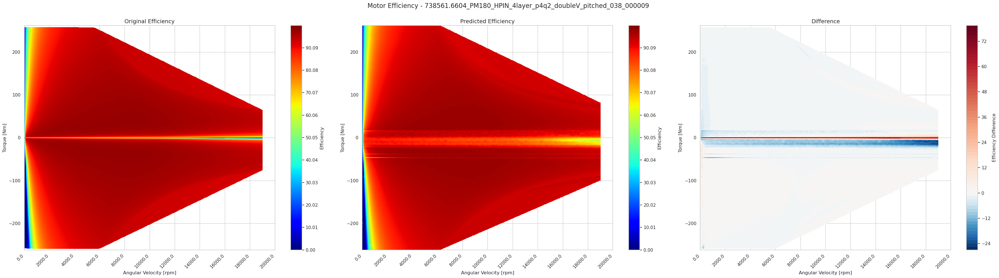

Sample 19:
Original ETA shape: (502, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (502,)
Predicted MM shape: (505,)


<Figure size 2400x2000 with 0 Axes>

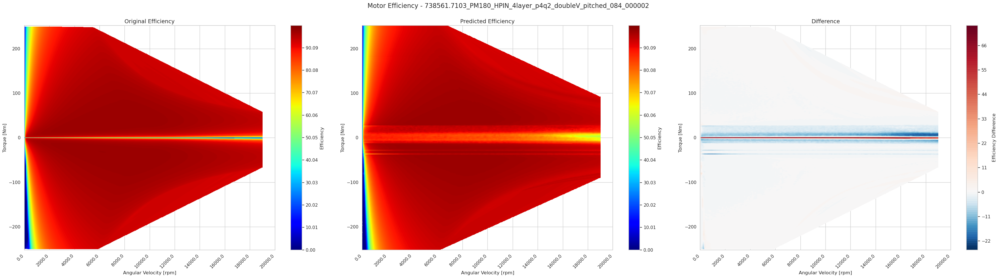

In [12]:
from src.utils import read_file_kpi3d, read_mm_nn
import numpy as np
import matplotlib.pyplot as plt
from src.inference import eval_plot_kpi3d

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

max_index = 20

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    print(f"Sample {index_no}:")
    print(f"Original ETA shape: {eta_kpi3d.shape}")
    print(f"Predicted ETA shape: {eta_predicted.shape}")
    print(f"Original MM shape: {mm_kpi3d.shape}")
    print(f"Predicted MM shape: {mm_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    eval_plot_kpi3d(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

Sample 0:
Original ETA shape: (544, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (544,)
Predicted MM shape: (571,)


<Figure size 2400x2000 with 0 Axes>

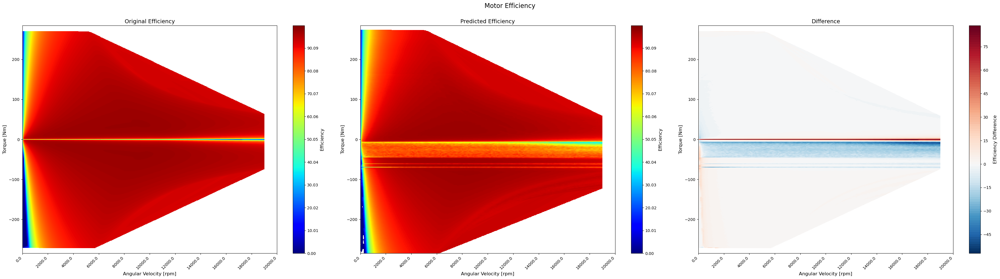

Sample 1:
Original ETA shape: (516, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (516,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

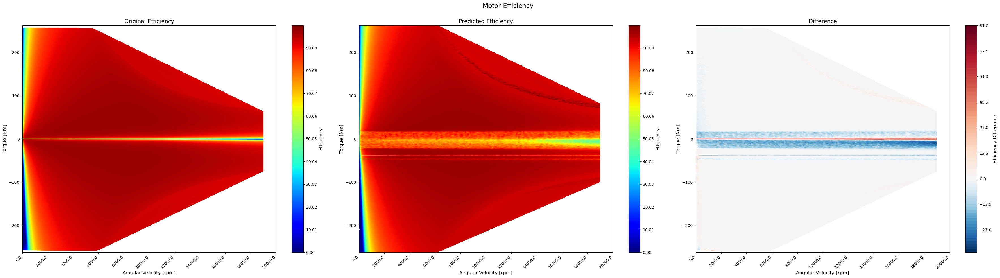

Sample 2:
Original ETA shape: (532, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (532,)
Predicted MM shape: (535,)


<Figure size 2400x2000 with 0 Axes>

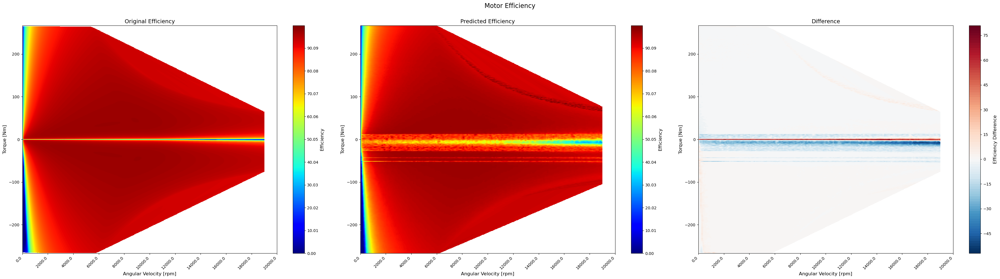

In [11]:
from src.utils import read_file_kpi3d, read_mm_nn
import numpy as np
import matplotlib.pyplot as plt
from src.inference import eval_plot_kpi3d

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

max_index = 3

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    print(f"Sample {index_no}:")
    print(f"Original ETA shape: {eta_kpi3d.shape}")
    print(f"Predicted ETA shape: {eta_predicted.shape}")
    print(f"Original MM shape: {mm_kpi3d.shape}")
    print(f"Predicted MM shape: {mm_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    eval_plot_kpi3d(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

In [11]:
from src.utils import read_file_kpi3d
import numpy as np
from src.inference import y2_score

nn_kpi_2d = list(range(0, 19100, 100))
#nn_kpi_2d = read_mm_nn(file_path, 'NN')
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

score=0
max_index = 50

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]

    score += y2_score(eta_kpi3d,eta_predicted)
    
y2_score = score/max_index
print(f"Average Y2 Score: {y2_score:.4f}")

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f3f90ab92d0>>
Traceback (most recent call last):
  File "/home/k64889/miniconda3/envs/thesis/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f3f90ab92d0>>
Traceback (most recent call last):
  File "/home/k64889/miniconda3/envs/thesis/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


In [12]:
from src.utils import read_file_kpi3d
from src.inference import y2_score
import numpy as np

nn_kpi_2d = list(range(0, 19100, 100))
#nn_kpi_2d = read_mm_nn(file_path, 'NN')
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

score=0
max_index = 5

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]

    score += y2_score(eta_kpi3d,eta_predicted)
    
y2_score = score/max_index
print(f"Average Y2 Score: {y2_score:.4f}")

Average Y2 Score: 8.9059


In [ ]:
Test scoring for y2

In [28]:
import numpy as np

# Sample data
nn = np.arange(0, 600, 100)  # 6 values from 0 to 500

# eta1: larger array (6x6)
eta1 = np.array([[3,6,6,5,5,3],
 [3,6,5,3,3,5],
 [6, 5, 3, 6, 6, 6],
 [5, 3 ,6 ,5, 5, 6]])

# eta2: smaller array (4x4)
eta2 = np.array([[3, 4, 4, 3, 6, 3],
 [5, 6, 6, 6, 5, 6]])


# Run the function
score = y2_score(eta1, eta2)

print(f"Y2 Score: {score}")


Original ETA shape: (4, 6)
Predicted ETA shape: (2, 6)

Interpolated smaller grid:
[[nan nan nan nan nan nan]
 [ 3.  4.  4.  3.  6.  3.]
 [ 5.  6.  6.  6.  5.  6.]
 [nan nan nan nan nan nan]]

Difference grid (Z_diff):
[[nan nan nan nan nan nan]
 [ 0.  2.  1.  0. -3.  2.]
 [ 1. -1. -3.  0.  1.  0.]
 [nan nan nan nan nan nan]]
Y2 Score: 1.5811388300841898


In [ ]:
Eval for y1

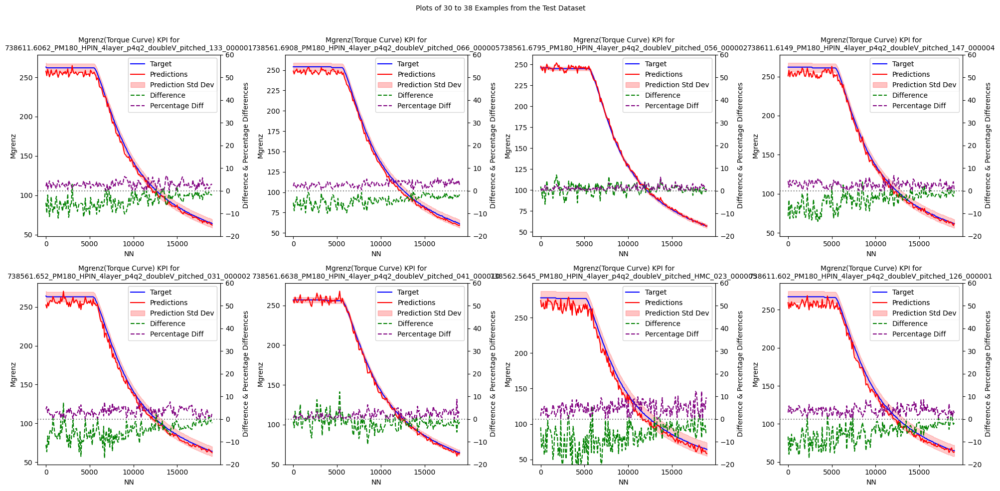

In [13]:
from src.inference import plot_testdataset_kpi2d, plot_mean_std_kpi2d, plot_std_kpi2d, eval_plot_kpi2d
eval_plot_kpi2d(df_test_y1_targets, df_predictions_y1,start=30, end=38, cols=4)

In [14]:
from src.inference import y1_score
y1_score=y1_score(df_predictions_y1, df_test_y1_targets)
print(f"Average Y1 Score: {y1_score:.4f}")

Average Y1 Score: 4.7164


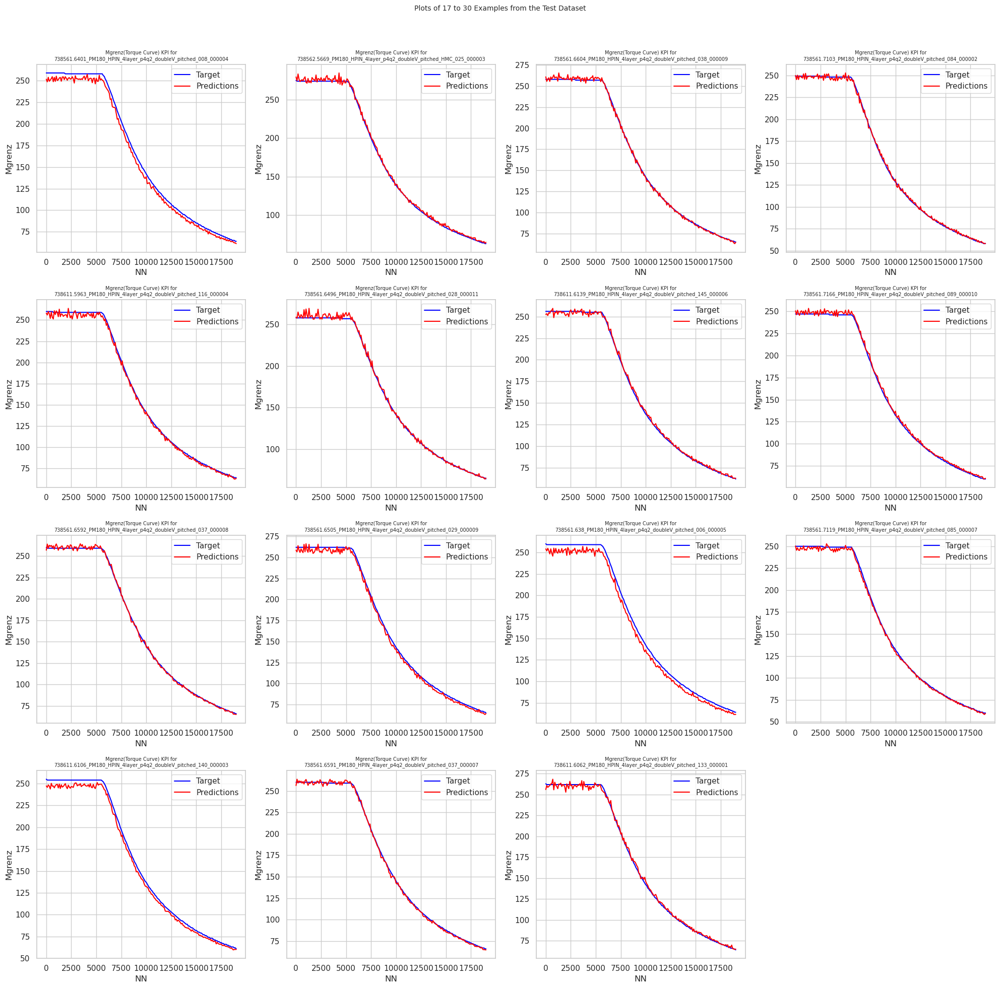

In [38]:
plot_testdataset_kpi2d(df_test_y1_targets, df_predictions_y1,start=17, end=30, cols = 4)

In [ ]:
Plots to draw conclusions from whole test sets

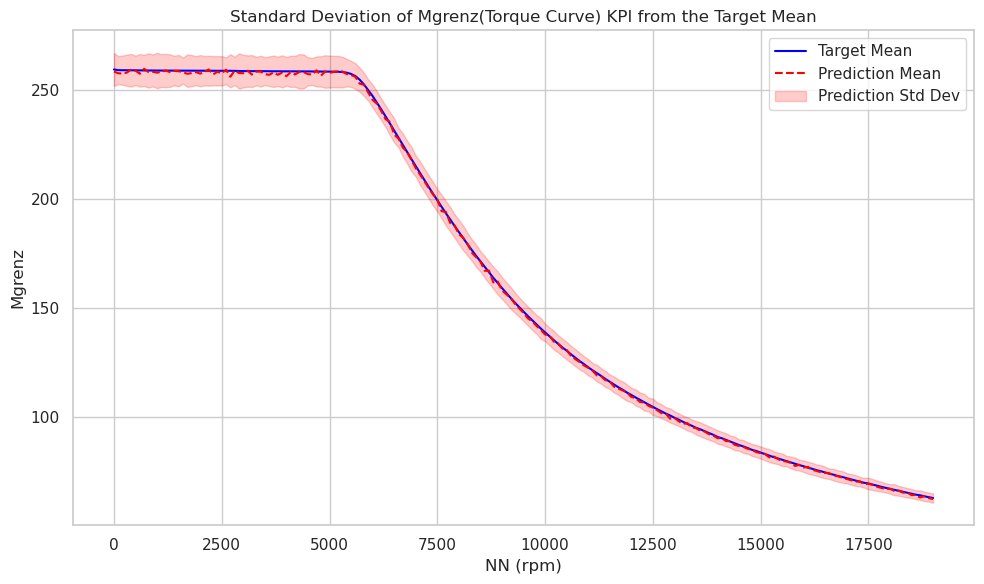

In [30]:
plot_std_kpi2d(df_test_y1_targets, df_predictions_y1)

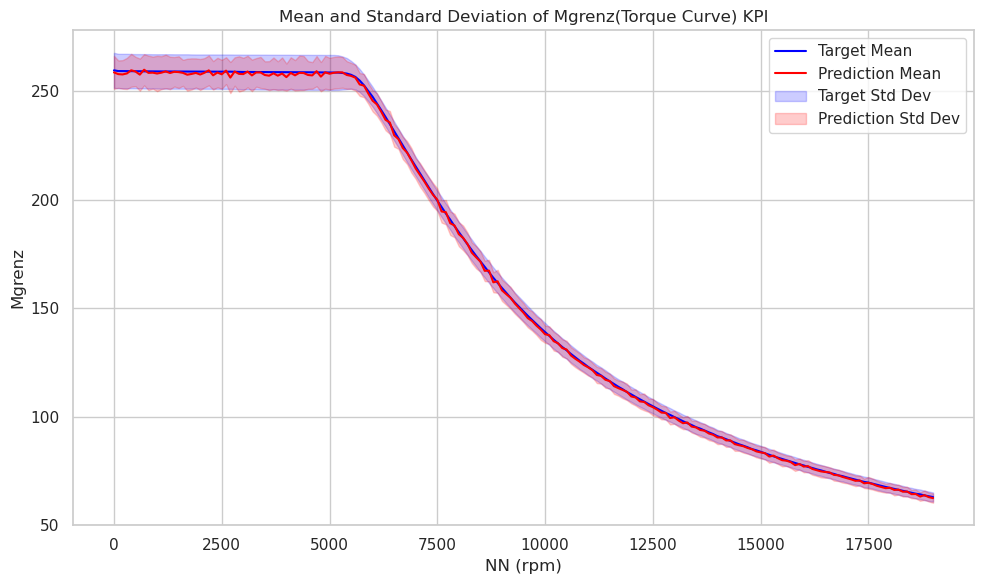

In [31]:
plot_mean_std_kpi2d(df_test_y1_targets, df_predictions_y1)###wrong

In [ ]:
Sklearn metrics

In [33]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, max_error, mean_poisson_deviance, mean_gamma_deviance, mean_absolute_percentage_error, d2_absolute_error_score
import numpy as np

def comprehensive_regression_metrics(df_targets, df_predictions):

    assert df_targets.index.equals(df_predictions.index), "Both target and prediction dfs must have the same index"
    
    metrics_list = []
    for index in df_targets.index:
        y_true = df_targets.loc[index].values
        y_pred = df_predictions.loc[index].values
        
        sample_metrics = {
            "MSE": mean_squared_error(y_true, y_pred),
            "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
            "MAE": mean_absolute_error(y_true, y_pred),
            "R2": r2_score(y_true, y_pred),
            "Max Error": max_error(y_true, y_pred),
            "Mean Poisson Deviance": mean_poisson_deviance(y_true, y_pred),
            "Mean Gamma Deviance": mean_gamma_deviance(y_true, y_pred),
            "MAPE": mean_absolute_percentage_error(y_true, y_pred),
            "D2 Absolute Error Score": d2_absolute_error_score(y_true, y_pred)
        }
        metrics_list.append(sample_metrics)
    
    df_metrics = pd.DataFrame(metrics_list, index=df_targets.index)
    return df_metrics

In [35]:
result_metrics = comprehensive_regression_metrics(df_test_y1_targets, df_predictions_y1)
result_metrics

,MSE,RMSE,MAE,R2,Max Error,Mean Poisson Deviance,Mean Gamma Deviance,MAPE,D2 Absolute Error Score
738562.5614_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_020_000013,11.532858,3.396006,2.767164,0.998213,9.307281,0.065347,0.000446,0.018181,0.962280
738561.6696_PM180_HPIN_4layer_p4q2_doubleV_pitched_047_000002,5.100788,2.258492,1.547511,0.999097,7.174622,0.022141,0.000113,0.008429,0.977660
738561.65_PM180_HPIN_4layer_p4q2_doubleV_pitched_029_000004,6.856725,2.618535,2.384864,0.998869,5.611420,0.041865,0.000321,0.016059,0.966661
738561.6576_PM180_HPIN_4layer_p4q2_doubleV_pitched_036_000003,3.032949,1.741537,1.396725,0.999478,4.387085,0.017967,0.000134,0.009282,0.980096
738561.6413_PM180_HPIN_4layer_p4q2_doubleV_pitched_009_000005,12.760759,3.572220,3.343611,0.997770,6.791931,0.086822,0.000712,0.023935,0.952055
738561.7001_PM180_HPIN_4layer_p4q2_doubleV_pitched_074_000010,2.371891,1.540095,1.162961,0.999572,5.460693,0.012130,0.000074,0.007063,0.983031
738611.6026_PM180_HPIN_4layer_p4q2_doubleV_pitched_127_000001,4.849437,2.202144,1.602686,0.999215,7.761078,0.022985,0.000131,0.009341,0.977789
738562.5546_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_015_000010,9.049293,3.008204,2.241480,0.998672,10.050049,0.042368,0.000239,0.012833,0.970180
738561.6756_PM180_HPIN_4layer_p4q2_doubleV_pitched_052_000007,3.399880,1.843876,1.467938,0.999386,4.882751,0.018797,0.000126,0.009539,0.978528
738561.6858_PM180_HPIN_4layer_p4q2_doubleV_pitched_061_000010,1.592913,1.262106,0.977277,0.999712,3.845612,0.008437,0.000057,0.006371,0.985718


Mgrenz is now taken from training data and MM not calculated coz predicted ETA grid can have only 1 size ie, max size but padded when size is not supposed to be equal